<a href="https://colab.research.google.com/github/shvnshnn02/PCVK_Ganjil_2023/blob/main/week07.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Kelompok 5:**

Agung Malik Al Qindy / 2141720114

Billie Faiqul Izzat / 214172020051

Shovinas Hanun / 2141720252

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

**Praktikum Filter**

In [ ]:
def convolution2d(image, kernel):
    tinggi = image.shape[0]
    lebar = image.shape[1]

    tinggi_kernel = kernel.shape[0]
    lebar_kernel = kernel.shape[1]

    start = int(lebar_kernel/2)

    image_result = np.copy(image)

    for y in range(start, tinggi - start):
        for x in range(start, lebar - start):
            value = 0

            for ky in range(tinggi_kernel):
                for kx in range(lebar_kernel):
                    i = y - start + ky
                    j = x - start + kx

                    value += image[i, j] * kernel[ky, kx]

            image_result[y, x] = np.clip(value, 0, 255)

    return image_result

In [ ]:
img = cv.imread('/content/drive/MyDrive/female.tiff')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

**Sharpen**

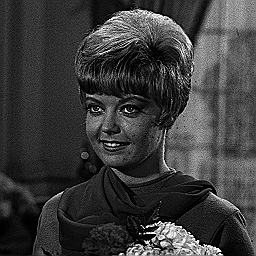

In [ ]:
kernel_sharpen = np.array([[0, -1, 0],
                          [-1, 5, -1],
                          [0, -1, 0]])

result_image = convolution2d(img_gray, kernel_sharpen)
cv2_imshow(result_image)

**Emboss**

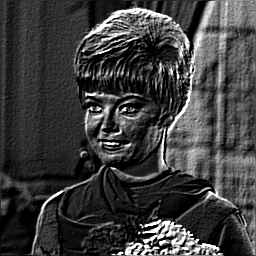

In [ ]:
kernel_emboss = np.array([[-2, -1, 0],
                          [-1, 1, 1],
                          [0, 1, 2]])

result_image = convolution2d(img_gray, kernel_emboss)
cv2_imshow(result_image)

**Left Sobel Edge Detection**

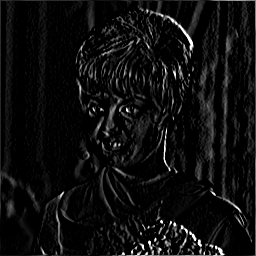

In [ ]:
left_sobel_edge_detection = np.array([[1, 0, -1],
                                              [2, 0, -2],
                                              [1, 0, -1]])

result_image = convolution2d(img_gray, left_sobel_edge_detection)
cv2_imshow(result_image)

**Canny Edge Detection**

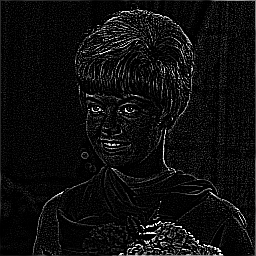

In [ ]:
canny_edge_detection = np.array([[-1, -1, -1],
                                        [-1, 8, -1],
                                        [-1, -1, -1]])

result_image = convolution2d(img_gray, canny_edge_detection)
cv2_imshow(result_image)

**Prewitt Edge Detection**

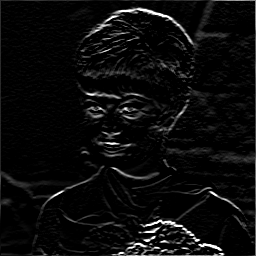

In [ ]:
prewitt_edge_detection_sharpen = np.array([[-1, -1, -1],
                                          [0, 0, 0],
                                          [1, 1, 1]])

result_image = convolution2d(img_gray, prewitt_edge_detection_sharpen)
cv2_imshow(result_image)

**5x5 Gaussian Blur**

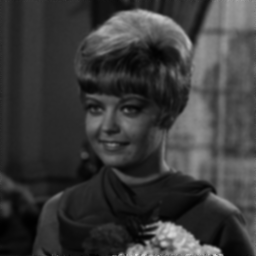

In [ ]:
gaussian_blur_5_x_5 = np.array([[1, 4, 6, 4, 1],
                                [4, 16, 24, 16, 4],
                                [6, 24, 36, 24, 6],
                                [4, 16, 24, 16, 4],
                                [1, 4, 6, 4, 1]], dtype=float)

gaussian_blur_5_x_5 /= 256

result_image = convolution2d(img_gray, gaussian_blur_5_x_5)
cv2_imshow(result_image)

**21x21 Gaussian Blur**

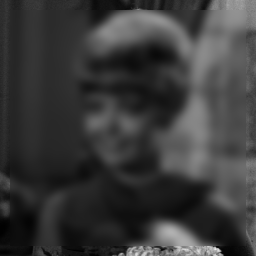

In [ ]:
kernel_size = 21
sigma=math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gaussian_blur_21_x_21 = gaussian_kernel @ gaussian_kernel.transpose()

result_image = convolution2d(img_gray, gaussian_blur_21_x_21)
cv2_imshow(result_image)

**Tugas KTP**

Diketahui dataset KTP dengan kondisi citra yang berbeda. Lakukan perbaikan melalui
implementasi teknik filterisasi dan detection setiap citra. Terapkan juga histogram equalization dan
operasi aritmatika sebagai Teknik pendukung perbaikan citra KTP.

In [ ]:
def gamma_correction(image, gamma):
  inv_gamma = 1 / gamma
  gamma_image = np.zeros(image.shape, image.dtype)

  # Akses per pixel
  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      for c in range(image.shape[2]):
        gamma_image[y, x, c] = np.clip((image[y, x, c] / 255) ** inv_gamma * 255, 0, 255)

  return gamma_image

def hitung_pixel(image):
  red = {}
  green = {}
  blue = {}

  # Akses per pixel
  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      b = int(image[y, x, 0])
      g = int(image[y, x, 1])
      r = int(image[y, x, 2])

      if r in red:
        red[r] += 1
      else:
        red[r] = 1

      if g in green:
        green[g] += 1
      else:
        green[g] = 1

      if b in blue:
        blue[b] += 1
      else:
        blue[b] = 1

  return red, green, blue

def histogram_equalization(image):

  # Intensitas Pixel
  intensitas_merah, intensitas_hijau, intensitas_biru = hitung_pixel(image)

  red_channel = hitung_sk(image[...,2], intensitas_merah)
  green_channel = hitung_sk(image[...,1], intensitas_hijau)
  blue_channel = hitung_sk(image[...,0], intensitas_biru)

  merged_image = cv.merge([blue_channel, green_channel, red_channel])

  return merged_image

def hitung_sk(image, list_intensitas):
  list_intensitas = dict(sorted(list_intensitas.items()))

  # l, rj dan nrj
  l = 256
  rj = list(list_intensitas.keys())
  nrj = list(list_intensitas.values())

  # K0
  k0 = []
  for i in range(len(rj)):
    if i == 0:
      k0.append(nrj[i])
    else:
      k0.append(nrj[i] + k0[i - 1])

  # Sk = round((L-1)/MAX(k0) * k0)
  sk = []
  list_pixel_baru = {}
  for i in range(len(rj)):
    k0s = (l - 1) / k0[-1] * k0[i]
    sk.append(round(k0s))

    list_pixel_baru[rj[i]] = sk[i]

  # Konversi nilai pixel
  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      image[y, x] = list_pixel_baru[image[y, x]]

  return image

kernel_sharpen = np.array([[0, -1, 0],
                          [-1, 5, -1],
                          [0, -1, 0]], dtype=np.float32)

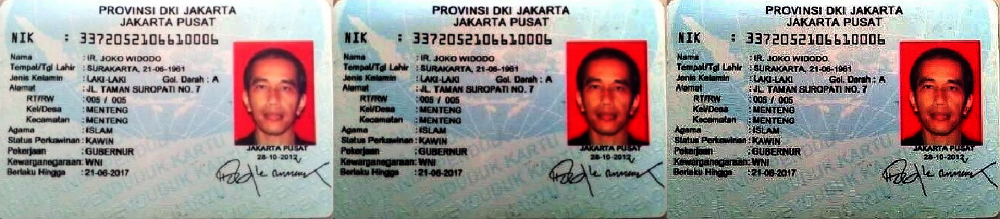

In [ ]:
ktp = cv.imread('/content/drive/MyDrive/KTP.jpg')
ktp_copy = np.copy(ktp)
ktp_result = gamma_correction(ktp_copy, 0.5)
ktp_filtered = convolution2d(ktp_result, kernel_sharpen)

final_frame = cv.hconcat((ktp, ktp_result, ktp_filtered))
cv2_imshow(final_frame)

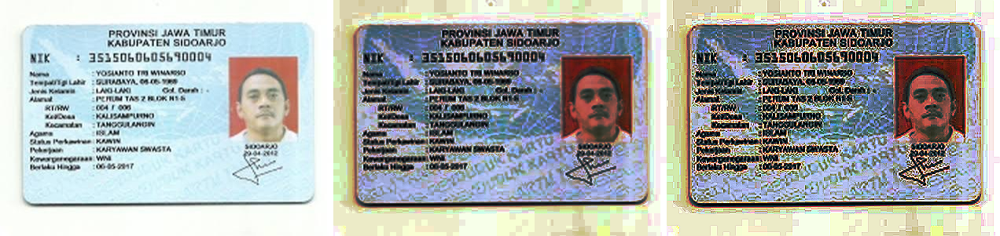

In [ ]:
ktp1 = cv.imread('/content/drive/MyDrive/KTP1_P7.jpg')
ktp1_copy = np.copy(ktp1)
ktp1_result = histogram_equalization(ktp1_copy)
ktp1_result = gamma_correction(ktp1_result, 1.4)
ktp1_filtered = convolution2d(ktp1_result, kernel_sharpen)

final_frame = cv.hconcat((ktp1, ktp1_result, ktp1_filtered))
cv2_imshow(final_frame)

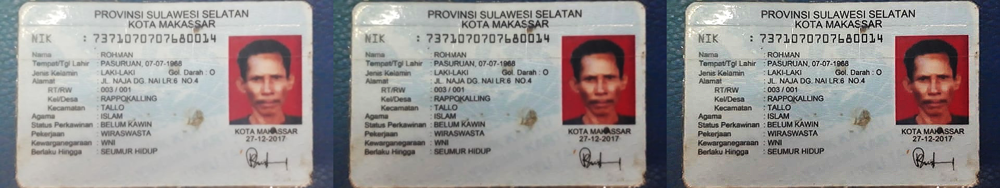

In [ ]:
ktp2 = cv.imread('/content/drive/MyDrive/KTP2_P2.jpg')
ktp2_copy = np.copy(ktp2)
ktp2_result = gamma_correction(ktp2_copy, 0.6)
ktp2_filtered = convolution2d(ktp2_result, kernel_sharpen)

final_frame = cv.hconcat((ktp2, ktp2_result, ktp2_filtered))
cv2_imshow(final_frame)

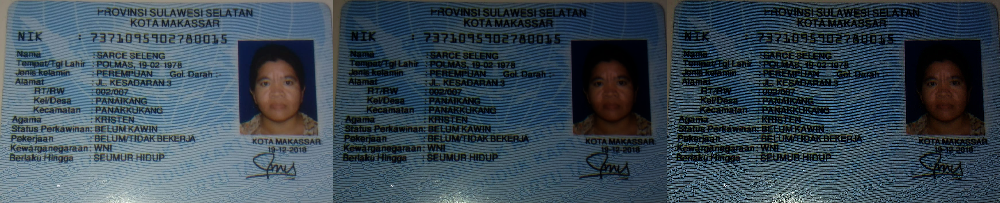

In [ ]:
ktp3 = cv.imread('/content/drive/MyDrive/KTP3_P7.jpg')
ktp3_copy = np.copy(ktp3)
ktp3_result = gamma_correction(ktp3_copy, 0.5)
ktp3_filtered = convolution2d(ktp3_result, kernel_sharpen)

final_frame = cv.hconcat((ktp3, ktp3_result, ktp3_filtered))
cv2_imshow(final_frame)

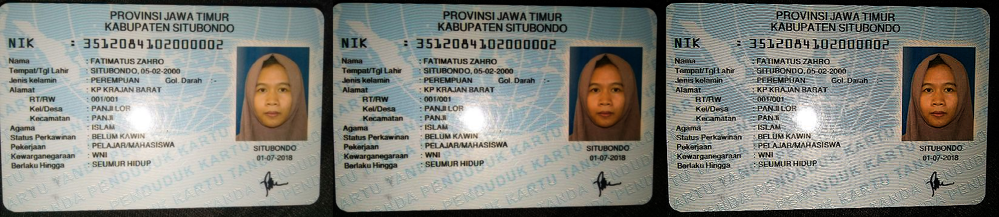

In [21]:
ktp5 = cv.imread('/content/drive/MyDrive/KTP5_P7.jpg')
ktp5_copy = np.copy(ktp5)
ktp5_result = gamma_correction(ktp5_copy, 0.6)
ktp5_filtered = convolution2d(ktp5_result, kernel_sharpen)

final_frame = cv.hconcat((ktp5, ktp5_result, ktp5_filtered))
cv2_imshow(final_frame)

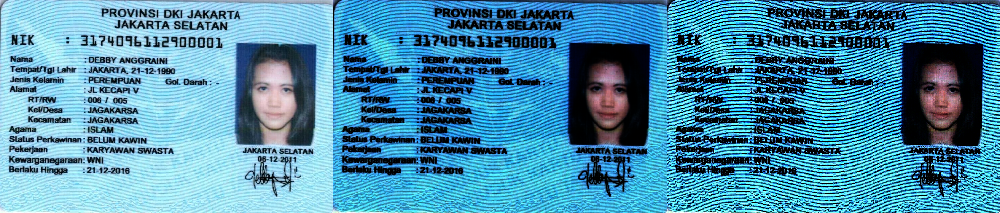

In [23]:
ktp6 = cv.imread('/content/drive/MyDrive/KTP6_P7.JPG')
ktp6_copy = np.copy(ktp6)
ktp6_result = gamma_correction(ktp6_copy, 0.3)
ktp6_filtered = convolution2d(ktp6_result, kernel_sharpen)

final_frame = cv.hconcat((ktp6, ktp6_result, ktp6_filtered))
cv2_imshow(final_frame)

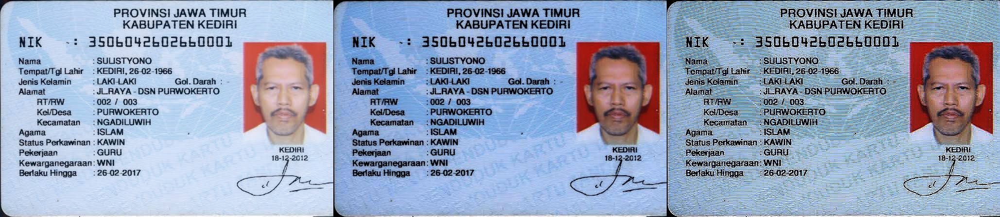

In [24]:
ktp7 = cv.imread('/content/drive/MyDrive/KTP7_P7.jpg')
ktp7_copy = np.copy(ktp7)
ktp7_result = gamma_correction(ktp7_copy, 0.48)
ktp7_filtered = convolution2d(ktp7_result, kernel_sharpen)

final_frame = cv.hconcat((ktp7, ktp7_result, ktp7_filtered))
cv2_imshow(final_frame)